<a href="https://colab.research.google.com/github/cpedebos/EGB-MC15/blob/main/SteeredMD_EGB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Hello there!**

This is a Jupyter notebook for running Steered Molecular Dynamics (SMD) simulations using OpenMM engine and AMBER force field. This notebook is a supplementary material of the paper "***Making it rain: Cloud-based molecular simulations for everyone***" ([link here](https://doi.org/10.1021/acs.jcim.1c00998)) and we encourage you to read it before using this pipeline.

The main goal of this notebook is to demonstrate how to harness the power of cloud-computing to run SMD simulations in a cheap and yet feasible fashion.

---

 **This notebook is NOT a standard protocol for SMD simulations!** It is just simple SMD pipeline illustrating each step of a simulation protocol.

---
**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/pablo-arantes/making-it-rain/issues

**Acknowledgments**
- We would like to thank the OpenMM team for developing an excellent and open source engine.

- A Making-it-rain by **Pablo R. Arantes** ([@pablitoarantes](https://twitter.com/pablitoarantes)), **Marcelo D. Polêto** ([@mdpoleto](https://twitter.com/mdpoleto)), **Conrado Pedebos** ([@ConradoPedebos](https://twitter.com/ConradoPedebos)) and **Rodrigo Ligabue-Braun** ([@ligabue_braun](https://twitter.com/ligabue_braun)).


- Also, credit to [David Koes](https://github.com/dkoes) for his awesome [py3Dmol](https://3dmol.csb.pitt.edu/) plugin.

- For related notebooks see: [Making-it-rain](https://github.com/pablo-arantes/making-it-rain)

# **Introduction**

This notebook demonstrates how to use steered molecular dynamics (SMD) to simulate the dissociation of a peptide from its protein target. Starting with a protein-peptide complex, we will perform an SMD simulation to pull the peptide away from the protein.

The script performs the following steps:
1. Loads the initial protein-peptide complex from a PDB file.
2. Defines a collective variable (CV) as the distance between the center of mass (COM) of the protein and the COM of the peptide.
3. Applies a harmonic restraint to this CV.
4. Runs a constant velocity steered MD simulation by moving the harmonic restraint's center at a constant velocity, effectively pulling the peptide from the protein.

## ---

# **Setting the environment for SMD calculation**

Firstly, we need to install all necessary libraries and packages for our simulation. The main packages we will be installing are:

1.    Anaconda (https://docs.conda.io/en/latest/miniconda.html)
2.    OpenMM (https://openmm.org/)
4.    py3Dmol (https://pypi.org/project/py3Dmol/)
5.    Numpy (https://numpy.org/)
6.    Matplotlib (https://matplotlib.org/)


In [ ]:
#@title **Install Conda Colab**
#@markdown It will restart the kernel (session), don't worry.
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:06
🔁 Restarting kernel...


In [ ]:
#@title **Install dependencies**
#@markdown It will take a few minutes, please, drink a coffee and wait. ;-)
# install dependencies
import subprocess
import sys
subprocess.run("rm -rf /usr/local/conda-meta/pinned", shell=True)
subprocess.run("pip -q install py3Dmol", shell=True)
subprocess.run("mamba install openmm", shell=True)
subprocess.run("pip install --upgrade MDAnalysis", shell=True)
subprocess.run("pip install numpy==1.23.5", shell=True)
subprocess.run("pip install logmd==0.1.33", shell=True)

#load dependencies
import sys
import openmm as mm
from openmm import *
from openmm.app import *
from openmm.unit import *
import os
import urllib.request
import numpy as np
import MDAnalysis as mda
import py3Dmol
import platform
import scipy.cluster.hierarchy
from scipy.spatial.distance import squareform
import scipy.stats as stats
import matplotlib.pyplot as plt
import pandas as pd
from scipy.interpolate import griddata
import seaborn as sb
from statistics import mean, stdev
from matplotlib import colors
from IPython.display import set_matplotlib_formats

## Using Google Drive to store simulation data

Google Colab does not allow users to keep data on their computing nodes. However, we can use Google Drive to read, write, and store our simulations files. Therefore, we suggest to you to:

1.   Create a folder in your own Google Drive and copy the necessary input files there.
2.   Copy the path of your created directory. We will use it below.

In [ ]:
#@title ### **Import Google Drive**
#@markdown Click in the "Run" buttom to make your Google Drive accessible.
from google.colab import drive

drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
#@title **Check if you correctly allocated GPU nodes**

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Fri Jul 18 01:20:33 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P0             43W /  400W |       5MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

---
---
# **Loading the necessary input files**

At this point, we should have all libraries and dependencies installed and all necessary input files already at your Google Drive folder.

Below, you should provide the names of all input files and the pathway of your Google Drive folder containing them. Please, don't use spaces in the files and folders names, i.e., protein_input.pdb, and so on.


In [ ]:
#@title **Please, provide the necessary input below:**
import os
Google_Drive_Path = '/content/drive/MyDrive/' #@param {type:"string"}
Input_file = '575.pdb' #@param {type:"string"}
Receptor_Chain = 'B' #@param {type:"string"}
Ligand_Chain = 'A' #@param {type:"string"}
#@markdown ---
workDir = Google_Drive_Path
# Copy the input file to the working directory
# !cp "{Input_file}" "{workDir}"
workDir2 = os.path.join(workDir)
workDir_check = os.path.exists(workDir2)
if workDir_check == False:
  os.mkdir(workDir2)
else:
  pass


INPUT_FILE       = os.path.join(workDir, f"{Input_file}")
RECEPTOR_MDA_SEL = f'chainID {Receptor_Chain}'
LIGAND_MDA_SEL   = f'chainID {Ligand_Chain}'


In [ ]:
#@title **Download files from GitHub and copy to Google Drive**

github_url = "https://github.com/cpedebos/EGB-MC15/tree/main/Colab_Day5" #@param {type:"string"}

# Extract the repository and path
repo_url = github_url.split('/tree/main/')[0]
sub_path = github_url.split('/tree/main/')[1]

# Clone the repository
!git clone {repo_url} /tmp/repo

# Construct the full path to the desired files in the cloned repository
source_path = f"/tmp/repo/{sub_path}"

# Copy the files to the Google Drive folder
!cp -r {source_path}/* {workDir}

print(f"Files from {github_url} downloaded and copied to {workDir}")

Cloning into '/tmp/repo'...
remote: Enumerating objects: 172, done.
remote: Counting objects: 100% (172/172), done.
remote: Compressing objects: 100% (169/169), done.
remote: Total 172 (delta 52), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (172/172), 33.78 MiB | 8.40 MiB/s, done.
Resolving deltas: 100% (52/52), done.
Files from https://github.com/cpedebos/EGB-MC15/tree/main/Colab_Day5 downloaded and copied to /content/drive/MyDrive/SMD_EGB2025


In [ ]:
#@title **Align structure to X axis and save the aligned structure**


import numpy as np
import MDAnalysis as mda
from MDAnalysis.analysis import align
from MDAnalysis.lib.transformations import rotation_matrix


def align_vector_to_xaxis(u, group1, group2, filename='aligned.pdb'):
    """
    Aligns the vector between two groups' centers of geometry to the X-axis.

    Args:
        u: MDAnalysis Universe
        group1: First atom group
        group2: Second atom group
        filename: Output filename for aligned structure
    """
    # Calculate centers of geometry
    cog1 = group1.center_of_geometry()
    cog2 = group2.center_of_geometry()

    # Vector between COGs (what we want to align to X-axis)
    vec = cog2 - cog1
    vec /= np.linalg.norm(vec)  # Normalize

    # X-axis unit vector
    x_axis = np.array([1, 0, 0])

    # Calculate rotation matrix
    if np.allclose(vec, x_axis):
        print("Vector is already aligned with X-axis")
        return

    # Handle anti-parallel case
    if np.allclose(vec, -x_axis):
        rot_vec = np.array([0, 1, 0])  # Rotate 180° around Y-axis
    else:
        rot_vec = np.cross(vec, x_axis)

    rot_vec /= np.linalg.norm(rot_vec)
    angle = np.arccos(np.dot(vec, x_axis))

    # Create rotation matrix
    rot_matrix = rotation_matrix(angle, rot_vec)

    # Apply rotation to all atoms
    u.atoms.translate(-cog1)  # Move COG1 to origin
    u.atoms.rotate(rot_matrix[:3,:3])  # Apply rotation
    u.atoms.translate(cog1)  # Move back

    # Write aligned structure
    u.atoms.write(os.path.join(workDir, f"{filename}"))
    print(f"Aligned structure saved to {filename}")

    # Verify alignment
    new_cog2 = group2.center_of_geometry()
    new_vec = new_cog2 - cog1
    new_vec /= np.linalg.norm(new_vec)
    print(f"Original vector: {vec}")
    print(f"New vector: {new_vec}")
    print(f"Dot product: {np.dot(new_vec, x_axis):.6f} (should be ~1)")

# Load your structure
u = mda.Universe(INPUT_FILE)  # Replace with your file

# Define your groups (example: protein and ligand)
protein = u.select_atoms(RECEPTOR_MDA_SEL)
ligand = u.select_atoms(LIGAND_MDA_SEL)  # Change to your ligand selection

# Align protein-ligand vector to X-axis
align_vector_to_xaxis(u, protein, ligand, 'aligned.pdb')

Aligned structure saved to aligned.pdb
Original vector: [ 0.1592679  -0.93453973  0.31822827]
New vector: [ 1.00000000e+00 -7.20436979e-09 -1.08466688e-08]
Dot product: 1.000000 (should be ~1)


/usr/local/lib/python3.11/site-packages/MDAnalysis/coordinates/PDB.py:777: UserWarning: Unit cell dimensions not found. CRYST1 record set to unitary values.
  warnings.warn("Unit cell dimensions not found. "
/usr/local/lib/python3.11/site-packages/MDAnalysis/coordinates/PDB.py:1154: UserWarning: Found no information for attr: 'formalcharges' Using default value of '0'
  warnings.warn("Found no information for attr: '{}'"


In [ ]:
#@title **Parameters to generate the Amber topology:**

Force_field = "AMBER14SB" #@param ["AMBER14SB", "AMBER99", "AMBER99SB"]
Water_type = "TIP3P" #@param ["TIP3P", "SPC/E"]

#@markdown Box Size (nanometers):

Box_X = 12 #@param {type:"slider", min:5, max:20, step:1}
Box_Y = 10 #@param {type:"slider", min:5, max:20, step:1}
Box_Z = 10 #@param {type:"slider", min:5, max:20, step:1}

#@markdown **ATTENTION**: Give the concentration in Molar units:

Ions = "NaCl" #@param ["NaCl", "KCl" ]

Concentration = "0.15" #@param {type:"string"}


#@markdown **Function to add missing hydrogen atoms based on pH:**

pH = "7.4" #@param {type:"string"}
if Force_field == "AMBER14SB" and Water_type == "TIP3P":
  water = "amber14/tip3p.xml"
  water_model = "tip3p"
  ff = "amber14-all.xml"
elif Force_field == "AMBER99SB" and Water_type == "TIP3P":
  water = "tip3p.xml"
  water_model = "tip3p"
  ff = "amber99sbildn.xml"
elif Force_field == "AMBER99" and Water_type == "TIP3P":
  water = "tip3p.xml"
  water_model = "tip3p"
  ff = "amber99sb.xml"
elif Force_field == "AMBER14SB" and Water_type == "SPC/E":
  water = "amber14/spce.xml"
  water_model = "spce"
  ff = "amber14-all.xml"
elif Force_field == "AMBER99SB" and Water_type == "SPC/E":
  water = "spce.xml"
  water_model = "spce"
  ff = "amber99sbildn.xml"
elif Force_field == "AMBER99" and Water_type == "SPC/E":
  water = "spce.xml"
  water_model = "spce"
  ff = "amber99sb.xml"
else:
  pass

box_x = int(Box_X) #* unit.nanometer
box_y = int(Box_Y) #* unit.nanometer
box_z = int(Box_Z) #* unit.nanometer

if Ions == "NaCl":
  positive_ion = 'Na+'
else:
  positive_ion = 'K+'

import openmm as mm
import openmm.app as app
import openmm.unit as unit
from openmm import Vec3
from sys import stdout
import numpy as np
from openmm import XmlSerializer
from openmm import CustomExternalForce, unit
import MDAnalysis as mda

# Load the PDB
pdb = app.PDBFile(os.path.join(workDir, f"aligned.pdb"))

# Load the force field
# forcefield = app.ForceField('amber14-all.xml', 'amber14/tip3p.xml')
forcefield = app.ForceField(ff, water)

# Prepare the system (solvation and adding ions if needed)
modeller = app.Modeller(pdb.topology, pdb.positions)
# Optional: modeller.addSolvent() here if needed

modeller.addHydrogens(forcefield, pH=float(pH))

# Add solvent and ions
# You can adjust the padding and ionicStrength as needed for your system
box_shape = Vec3(box_x, box_y, box_z)

modeller.addSolvent(forcefield, model=water_model, boxSize=box_shape*unit.nanometer, ionicStrength=float(Concentration) * unit.molar,
    positiveIon=positive_ion, negativeIon='Cl-',
)

with open(os.path.join(workDir, f"initial_structure.pdb"), 'w') as f:
    app.PDBFile.writeFile(modeller.topology, modeller.positions, f)

#Export PDB file
system_pdb = os.path.join(workDir, 'system.pdb')
PDBFile.writeFile(modeller.topology, modeller.positions, open(system_pdb, 'w'))

# Hydrogen mass repartitioning
hydrogen_mass = 4 * unit.amu

# Create the system with PME and HMR
system = forcefield.createSystem(
    modeller.topology,
    nonbondedMethod=app.PME,
    nonbondedCutoff=1.0*unit.nanometers,
    constraints=app.HBonds,
    hydrogenMass=hydrogen_mass
)
with open(os.path.join(workDir, f"topology.xml"), 'w') as f:
    f.write(XmlSerializer.serialize(system))
selection='not name H* and not resname HOH NA CL'

In [ ]:
#@title **Show 3D structure**
import warnings
warnings.filterwarnings('ignore')
import py3Dmol

color = "gray" #@param ["gray", "rainbow"]
show_mainchains = False #@param {type:"boolean"}
show_box = True #@param {type:"boolean"}
box_opacity = 0.6 #@param {type:"slider", min:0, max:1, step:0.1}

def show_pdb(show_mainchains=False, show_box = False, color="rainbow"):
  # view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view = py3Dmol.view(1000,600)

  view.addModel(open(system_pdb,'r').read(),'pdb')

  if color == "gray":
    view.setStyle({'cartoon':{}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})

  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  if show_box:
    view.addSurface(py3Dmol.SAS, {'opacity': box_opacity, 'color':'white'})

  view.zoomTo()
  return view


show_pdb(show_mainchains, show_box, color).show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
#@title ### **MD Equilibration protocol:**


Minimization_steps = "1000" #@param ["1000", "5000", "10000", "20000", "50000", "100000"]

Equilibration_steps = "5000" #@param ["1000", "5000", "10000", "20000", "50000", "100000"]
#@markdown Integration time (in femtoseconds):

Integration_timestep = "4" #@param ["2", "4"]
dt_eq = Integration_timestep

#@markdown Temperature (in Kelvin) and Pressure (in bar)
Temperature = 298 #@param {type:"string"}
temperature_eq = Temperature

#@markdown Position restraints force constant (in kJ/mol):
Force_constant = 1000 #@param {type:"slider", min:0, max:2000, step:100}

Number_of_replicas = 3 #@param {type:"slider", min:1, max:100, step:1}

#@markdown ---

import os
import numpy as np
import openmm as mm
import openmm.app as app
import openmm.unit as unit
from openmm import XmlSerializer, CustomExternalForce
import MDAnalysis as mda
from sys import stdout
import glob
from MDAnalysis.analysis import distances
from MDAnalysis.analysis import align
import matplotlib.pyplot as plt
from datetime import datetime

def run_equilibration(replica_id, pdb_file=os.path.join(workDir, f"initial_structure.pdb"), xml_topology=os.path.join(workDir, f"topology.xml"),
                      selection='not name H* and not resname HOH NA CL', dt = int(dt_eq), temp = float(temperature_eq), min_steps = int(Minimization_steps),
                      restraint_fc=int(Force_constant), nsteps=int(Equilibration_steps)):
    """
    Runs equilibration for a given replica.

    Parameters:
    - replica_id : int, replica number (used to create folder)
    - pdb_file : str, path to PDB file
    - xml_topology : str, path to OpenMM serialized system (XML)
    - selection : str, MDAnalysis selection string for positional restraints
    - restraint_fc : float, force constant for restraints in kJ/mol/nm^2
    - nsteps : int, number of equilibration steps
    """

    folder = os.path.join(workDir, f'replica_{replica_id}')
    os.makedirs(folder, exist_ok=True)

    print(f"\n===== Starting equilibration for replica {replica_id} =====")

    # Load the system and structure
    pdb = app.PDBFile(pdb_file)

    with open(xml_topology) as inputfile:
        system = XmlSerializer.deserialize(inputfile.read())

    # Apply positional restraints
    system = apply_restraints(system, pdb_file, restraint_fc, selection)
    dt_eq = dt/1000
    # Create the integrator
    integrator = mm.LangevinMiddleIntegrator(
        temp * unit.kelvin,      # temperature
        1 / unit.picosecond,    # friction coefficient
        float(dt_eq) * unit.picoseconds  # 4 fs timestep
    )

    # Set up the simulation
    simulation = app.Simulation(pdb.topology, system, integrator)
    simulation.context.setPositions(pdb.positions)

    # Energy minimization
    print("Minimizing energy...")
    # simulation.minimizeEnergy()
    simulation.minimizeEnergy(tolerance=10*kilojoule/mole/nanometer, maxIterations=int(min_steps))
    print("Energy minimization finished.")

    # Set initial velocities
    simulation.context.setVelocitiesToTemperature(300 * unit.kelvin)

    # Add reporters
    simulation.reporters.append(app.DCDReporter(os.path.join(folder, 'equil.dcd'), 500))
    simulation.reporters.append(app.StateDataReporter(
        os.path.join(folder, 'equil.log'), 500,
        step=True, time=True, potentialEnergy=True,
        temperature=True, speed=True, progress=True, totalSteps=nsteps, separator='\t'
    ))

    # Run equilibration
    print("Starting equilibration...")
    simulation.step(nsteps)
    print("Equilibration finished.")

    # Save restart state
    print("Saving restart state...")
    state = simulation.context.getState(getPositions=True, getVelocities=True)
    with open(os.path.join(folder, 'equil.rst'), 'w') as f:
        f.write(XmlSerializer.serialize(state))

    print(f"===== Finished equilibration for replica {replica_id} =====")


def apply_restraints(system, pdbfile, fc, selection_string):
    """
    Apply positional restraints using MDAnalysis selection.

    Parameters:
    - system : OpenMM system
    - pdbfile : str, path to pdb file
    - fc : float, force constant
    - selection_string : str, atom selection string

    Returns:
    - system with restraints added
    """

    u = mda.Universe(pdbfile)
    selected = u.select_atoms(selection)
    indices = selected.indices

    if fc > 0:
        restraint = CustomExternalForce('k*periodicdistance(x, y, z, x0, y0, z0)^2')
        restraint.addPerParticleParameter('k')
        restraint.addPerParticleParameter('x0')
        restraint.addPerParticleParameter('y0')
        restraint.addPerParticleParameter('z0')

        for idx in indices:
            pos = u.atoms[idx].position / 10.0  # Å to nm
            restraint.addParticle(int(idx), [fc, pos[0], pos[1], pos[2]])

        system.addForce(restraint)

    return system

# Number of replicas
N_REPLICAS = int(Number_of_replicas)

for i in range(N_REPLICAS):
    run_equilibration(replica_id=i)


===== Starting equilibration for replica 0 =====
Minimizing energy...
Energy minimization finished.
Starting equilibration...
Equilibration finished.
Saving restart state...
===== Finished equilibration for replica 0 =====

===== Starting equilibration for replica 1 =====
Minimizing energy...
Energy minimization finished.
Starting equilibration...
Equilibration finished.
Saving restart state...
===== Finished equilibration for replica 1 =====

===== Starting equilibration for replica 2 =====
Minimizing energy...
Energy minimization finished.
Starting equilibration...
Equilibration finished.
Saving restart state...
===== Finished equilibration for replica 2 =====


---
---
# **Running a SMD simulation**

Finally, we will proceed with the SMD simulation itself using the equilibrated system coordinates as input structure.

Note that we will use here a *.rst state file* , which contains atomic velocities and positions from the last frame of the equilibration simulation, guaranteeing that our SMD simulation begins from a thermodynamically equilibrated system.



In [ ]:
#@markdown ### **SMD protocol:**
#@markdown Integration time (in femtoseconds):

Integration_timestep = "4" #@param ["2", "4"]
dt_prod = Integration_timestep

#@markdown Temperature (in Kelvin) and Pressure (in bar)
Temperature = 298 #@param {type:"string"}
temperature_prod = Temperature
#@markdown Pulling force constant (in kJ/mol):
Force_constant = 1000 #@param {type:"slider", min:0, max:2000, step:100}
#@markdown Pulling speed (in nm/ps):
Velocity_pulling = 0.01 #@param {type:"slider", min:0.01, max:0.1, step:0.01}

Number_of_replicas = 3 #@param {type:"slider", min:1, max:100, step:1}

#adicionar na função todas as variaveis novas e mudar o código para aceita-las

import os
import numpy as np
import openmm as mm
import openmm.app as app
import openmm.unit as unit
from openmm import XmlSerializer, CustomExternalForce
import MDAnalysis as mda
from sys import stdout
import glob
from MDAnalysis.analysis import distances
from MDAnalysis.analysis import align
import matplotlib.pyplot as plt
from datetime import datetime

def run_pulling(replica_id, pdb_file=os.path.join(workDir, f"initial_structure.pdb"), xml_topology=os.path.join(workDir, f"topology.xml"),
                dt=int(dt_prod), temp=int(temperature_prod),f_constant=int(Force_constant), v_pull=float(Velocity_pulling)):
    """
    Runs pulling simulation for a given replica.

    Parameters:
    - replica_id : int, replica number (used to create folder)
    - pdb_file : str, path to PDB file
    - xml_topology : str, path to OpenMM serialized system (XML)
    """

    folder = os.path.join(workDir,  f'replica_{replica_id}')
    os.makedirs(folder, exist_ok=True)

    print(f"\n===== Starting pulling for replica {replica_id} =====")

    # Load files
    pdb = app.PDBFile(pdb_file)
    with open(xml_topology) as input:
        system = XmlSerializer.deserialize(input.read())

    # Define groups
    ligand_atoms = [atom.index for atom in pdb.topology.atoms() if atom.residue.chain.id == 'A']
    receptor_atoms = [atom.index for atom in pdb.topology.atoms() if atom.residue.chain.id == 'B']
    pull_group1 = receptor_atoms
    pull_group2 = ligand_atoms

    # Pulling parameters
    fc_pull = f_constant * unit.kilojoules_per_mole / unit.nanometers**2
    v_pulling = v_pull * unit.nanometers / unit.picoseconds

    # Add pulling force
    force = mm.CustomCentroidBondForce(2, '0.5 * fc_pull * (distance(g1,g2) - r0)^2')
    force.addPerBondParameter('fc_pull')
    force.addGlobalParameter('r0', 0.0)
    force.addGroup(pull_group1)
    force.addGroup(pull_group2)
    force.addBond([0, 1], [fc_pull.value_in_unit(unit.kilojoule_per_mole/unit.nanometer**2)])
    system.addForce(force)
    dt_prod = dt/1000

    # Integrator
    integrator = mm.LangevinMiddleIntegrator(
        temp*unit.kelvin, 1/unit.picosecond, dt_prod*unit.picoseconds
    )

    # Simulation
    simulation = app.Simulation(pdb.topology, system, integrator)
    simulation.context.setPositions(pdb.positions)

    # Load restart state from the replica folder
    equil_rst = os.path.join(folder, 'equil.rst')
    with open(equil_rst, 'r') as f:
        simulation.context.setState(XmlSerializer.deserialize(f.read()))
        simulation.currentStep = 0
        simulation.context.setTime(0 * unit.picoseconds)

    # ================= INIT Pulling =================
    state = simulation.context.getState(getPositions=True)
    positions = state.getPositions()

    def calculate_com(positions, atom_group):
        total_mass = 0.0
        com = np.zeros(3)
        for i in atom_group:
            mass = system.getParticleMass(i).value_in_unit(unit.daltons)
            total_mass += mass
            pos = positions[i].value_in_unit(unit.nanometers)
            com += mass * np.array([pos[0], pos[1], pos[2]])
        return com / total_mass

    com1 = calculate_com(positions, pull_group1)
    com2 = calculate_com(positions, pull_group2)
    d0 = np.linalg.norm(com2 - com1)
    simulation.context.setParameter('r0', d0)

    print(f"Initial distance: {d0:.3f} nm")

    # =================== MAIN LOOP ===================
    total_steps = 250000
    report_interval = 2500
    traj_interval = 2500
    mindist_check_interval = 25000
    mindist_threshold = 0.8

    dcd_path = os.path.join(folder, 'smd_traj.dcd')
    force_txt_path = os.path.join(folder, 'pulling_force.txt')
    log_path = os.path.join(folder, 'pulling.log')

    simulation.reporters.append(app.DCDReporter(dcd_path, traj_interval))
    simulation.reporters.append(app.StateDataReporter(log_path, report_interval, step=True, time=True,
                                                      potentialEnergy=True, temperature=True, speed=True))

    force_reporter = PullingForceReporter(force_txt_path, report_interval,
                                          fc_pull.value_in_unit(unit.kilojoule_per_mole/unit.nanometer**2),
                                          pull_group1, pull_group2, system)

    print("Starting pulling simulation...")
    for step in range(total_steps):
        current_time = simulation.context.getState().getTime()

        r0 = d0 + v_pulling.value_in_unit(unit.nanometer/unit.picosecond) * current_time.value_in_unit(unit.picoseconds)
        simulation.context.setParameter('r0', r0)

        simulation.step(1)

        if (step + 1) % report_interval == 0:
            state = simulation.context.getState(getPositions=True, getEnergy=False)
            force_reporter.report(simulation, state, r0)

        if (step + 1) % mindist_check_interval == 0:
            state = simulation.context.getState(getPositions=True, getEnergy=False)
            box_vectors = state.getPeriodicBoxVectors().value_in_unit(unit.nanometers)
            pos = state.getPositions()

            current_mindist = calculate_mindist(pos, pull_group1, pull_group2, box_vectors)

            print(f"Step {step+1}: Current minDist = {current_mindist:.3f} nm")

            if current_mindist >= mindist_threshold:
                print(f"Reached minDist threshold of {mindist_threshold} nm. Stopping simulation.")
                break

    print(f"===== Finished pulling for replica {replica_id} =====")


# -------- Helper Classes --------
class PullingForceReporter:
    def __init__(self, file, reportInterval, force_constant, group1, group2, system):
        self._reportInterval = reportInterval
        self._out = open(file, 'w')
        self._out.write("Time(ps)\tForce(kJ/mol/nm)\tDistance(nm)\tRefDistance(nm)\n")
        self.k = force_constant
        self.group1 = group1
        self.group2 = group2
        self.system = system

    def report(self, simulation, state, r0_used):
        time = state.getTime().value_in_unit(unit.picoseconds)
        positions = state.getPositions()
        com1 = self.calculate_com(positions, self.group1)
        com2 = self.calculate_com(positions, self.group2)
        current_dist = np.linalg.norm(com2 - com1)
        force = -self.k * (current_dist - r0_used)

        self._out.write(f"{time:.3f}\t{force:.3f}\t{current_dist:.5f}\t{r0_used:.5f}\n")
        self._out.flush()

    def calculate_com(self, positions, atom_group):
        total_mass = 0.0
        com = np.zeros(3)
        for i in atom_group:
            mass = self.system.getParticleMass(i).value_in_unit(unit.daltons)
            total_mass += mass
            pos = positions[i].value_in_unit(unit.nanometers)
            com += mass * np.array([pos[0], pos[1], pos[2]])
        return com / total_mass

def calculate_mindist(positions, group1, group2, box_vectors=None):
    pos1 = np.array([positions[i].value_in_unit(unit.nanometers) for i in group1])
    pos2 = np.array([positions[j].value_in_unit(unit.nanometers) for j in group2])

    delta = pos1[:, np.newaxis, :] - pos2[np.newaxis, :, :]

    if box_vectors is not None:
        box_lengths = np.array([box_vectors[0][0], box_vectors[1][1], box_vectors[2][2]])
        delta -= np.round(delta / box_lengths) * box_lengths

    dist_matrix = np.linalg.norm(delta, axis=2)

    return np.min(dist_matrix)

def calculate_min_distances(replica_id,
                             pdb_file='initial_structure.pdb',
                             traj_file='smd_traj.dcd',
                             receptor_sel=f'chainID {Receptor_Chain}',
                             ligand_sel=f'chainID {Ligand_Chain}'):
    """
    Calculate minimum distances between receptor and ligand for a given replica trajectory.

    Parameters:
    - replica_id : int, replica folder ID
    - pdb_file : str, path to PDB file
    - traj_file : str, trajectory filename (within replica folder)
    - receptor_sel : str, MDAnalysis selection string for receptor
    - ligand_sel : str, MDAnalysis selection string for ligand
    """

    folder = os.path.join(workDir,  f'replica_{replica_id}')
    print(f"\n===== Calculating min distances for replica {replica_id} =====")

    # Create Universe
    u = mda.Universe(os.path.join(workDir, pdb_file), os.path.join(folder, traj_file))

    # Select atom groups
    recenter_group = u.select_atoms(receptor_sel)
    mol1 = u.select_atoms(receptor_sel)
    mol2 = u.select_atoms(ligand_sel)

    # Prepare array to store distances
    min_distances = np.zeros(len(u.trajectory))

    # Loop over trajectory frames
    for i, ts in enumerate(u.trajectory):
        u.atoms.pack_into_box()

        center = recenter_group.center_of_geometry()
        u.atoms.positions -= center

        dist_array = distances.distance_array(mol1.positions, mol2.positions, box=ts.dimensions)
        min_distances[i] = dist_array.min()

        if i % 100 == 0:
            print(f"Processed frame {i + 1}/{len(u.trajectory)}")

    # Save result to file inside replica folder
    out_file = os.path.join(folder, 'min_distances.dat')
    np.savetxt(out_file, min_distances)

    print(f"Minimum distances saved to {out_file}")


def align_and_save_trajectory(replica_id,
                               pdb_file="initial_structure.pdb",
                               traj_file='smd_traj.dcd'):
    """
    Align trajectory to the initial structure and save protein-only trajectory (without waters or ions).
    """
    folder = os.path.join(workDir,  f'replica_{replica_id}')
    pdb_in = os.path.join(workDir, pdb_file)
    print(f"\n===== Aligning and saving trajectory for replica {replica_id} =====")

    traj_path = os.path.join(folder, traj_file)

    pdb_basename = os.path.splitext(pdb_file)[0]
    traj_basename = os.path.splitext(traj_file)[0]

    aligned_pdb = os.path.join(folder, f'{pdb_basename}_nw.pdb')
    aligned_dcd = os.path.join(folder, f'{traj_basename}_nw.dcd')

    # Load trajectory and reference
    u = mda.Universe(pdb_in, traj_path)
    ref = mda.Universe(pdb_in, pdb_in)

    # Align trajectory to the reference structure based on CA atoms
    align.AlignTraj(u, ref, select='protein and name CA', in_memory=True).run()

    # Select protein atoms (without waters and ions)
    protein = u.select_atoms('protein')

    # Write aligned trajectory
    with mda.Writer(aligned_dcd, protein.n_atoms) as W:
        for ts in u.trajectory:
            W.write(protein)

    # Write aligned pdb
    ref.select_atoms('protein').write(aligned_pdb)

    print(f"Aligned trajectory written to {aligned_dcd}")
    print(f"Aligned pdb written to {aligned_pdb}")

    return aligned_pdb, aligned_dcd


# Number of replicas
N_REPLICAS = int(Number_of_replicas)

for i in range(N_REPLICAS):
    run_pulling(replica_id=i)
    calculate_min_distances(replica_id=i)
    align_and_save_trajectory(replica_id=i)


===== Starting pulling for replica 0 =====
Initial distance: 2.598 nm
Starting pulling simulation...
Step 25000: Current minDist = 0.184 nm
Step 50000: Current minDist = 0.253 nm
Step 75000: Current minDist = 1.282 nm
Reached minDist threshold of 0.8 nm. Stopping simulation.
===== Finished pulling for replica 0 =====

===== Calculating min distances for replica 0 =====
Processed frame 1/30
Minimum distances saved to /content/drive/MyDrive/SMD_EGB2025/replica_0/min_distances.dat

===== Aligning and saving trajectory for replica 0 =====
Aligned trajectory written to /content/drive/MyDrive/SMD_EGB2025/replica_0/smd_traj_nw.dcd
Aligned pdb written to /content/drive/MyDrive/SMD_EGB2025/replica_0/initial_structure_nw.pdb

===== Starting pulling for replica 1 =====
Initial distance: 2.601 nm
Starting pulling simulation...
Step 25000: Current minDist = 0.166 nm
Step 50000: Current minDist = 0.252 nm
Step 75000: Current minDist = 1.225 nm
Reached minDist threshold of 0.8 nm. Stopping simulatio

---
---
# **Analysis**

Although visualizing your trajectory can be quite useful, sometimes you also want more quantitative data.

Below, you can find a few examples of code snippets that can help you to shed some light on your SMD.


===== Running dissociation analysis for replica 0 =====

===== Running dissociation analysis for replica 1 =====

===== Running dissociation analysis for replica 2 =====
=== SUMMARY OF DISSOCIATION SIMULATIONS ===
Number of valid replicas for peak force: 3
Number of valid replicas for work to break: 3
Number of valid replicas for time to 5A: 3

Peak Force: 628.29 ± 46.14 kJ/mol/nm (N=3)
Work to Break Chemical Interactions: 868.61 ± 75.81 kJ/mol (N=3)
Time to Reach 5Å: 246.67 ± 4.71 ps (N=3)



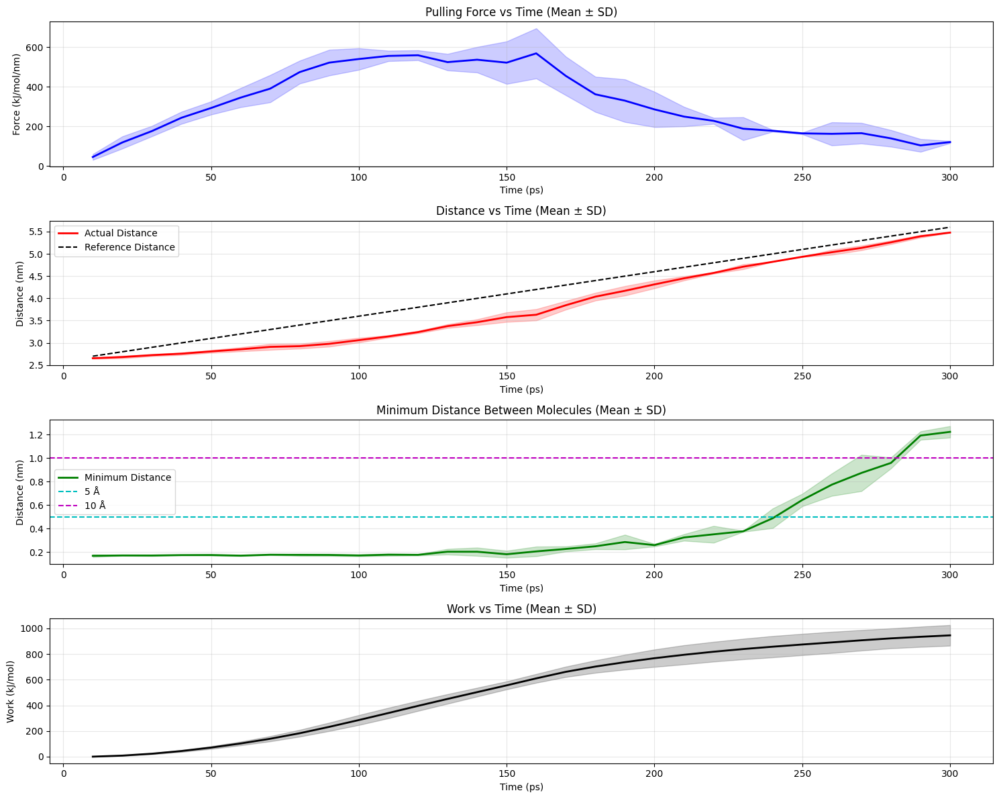

=== DISSOCIATION SUMMARY ACROSS REPLICAS ===

Minimal dissociation threshold: 5 Å
Full dissociation threshold: 10 Å

Average time to minimal dissociation: 246.67 ± 4.71 ps
Average work to minimal dissociation: 868.61 ± 75.81 kJ/mol

Average time to full dissociation: 283.33 ± 9.43 ps
Average work to full dissociation: 928.23 ± 81.94 kJ/mol




In [ ]:
#@title **Dissociation Analysis**

Number_of_replicas = 3 #@param {type:"slider", min:1, max:100, step:1}
#@markdown **Minimal_dissociation_threshold (Å):**
Min_threshold = 5 #@param {type:"slider", min:1, max:20, step:1}
#@markdown **Full_dissociation_threshold (Å):**
Full_threshold =  10 #@param {type:"slider", min:1, max:30, step:1}

import numpy as np
import os
import matplotlib.pyplot as plt
from datetime import datetime

def run_dissociation_analysis(replica_id,
                               min_dissociation=5.0,
                               full_dissociation=10.0,
                               force_file='pulling_force.txt',
                               mindist_file='min_distances.dat',
                               save_results=True):
    """
    Perform dissociation analysis for a given replica.

    Parameters:
    - replica_id (int): Replica number (folder name: replica_{replica_id})
    - min_dissociation (float): Minimal dissociation threshold in Å
    - full_dissociation (float): Full dissociation threshold in Å
    - force_file (str): Pulling force file inside the replica folder
    - mindist_file (str): Minimum distance file inside the replica folder
    - save_results (bool): If True, saves plots and summary file
    """
    folder = os.path.join(workDir,  f'replica_{replica_id}')
    force_path = os.path.join(folder, force_file)
    mindist_path = os.path.join(folder, mindist_file)
    output_prefix = os.path.join(folder, 'dissociation_analysis')

    print(f"\n===== Running dissociation analysis for replica {replica_id} =====")

    # === Constants ===
    ANGSTROM_TO_NM = 0.1
    MINIMAL_DISSOCIATION_DISTANCE = min_dissociation * ANGSTROM_TO_NM
    FULL_DISSOCIATION_DISTANCE = full_dissociation * ANGSTROM_TO_NM

    # === Load Data ===
    data = np.loadtxt(force_path, skiprows=1)
    min_distances = np.loadtxt(mindist_path)  # in Å

    min_distances_nm = min_distances * ANGSTROM_TO_NM

    time = data[:, 0]         # ps
    force = data[:, 1]        # kJ/mol/nm
    distance = data[:, 2]     # nm
    ref_distance = data[:, 3] # nm

    initial_distance = distance[0]

    # === Detect Minimal Dissociation ===
    minimal_condition = np.where(min_distances_nm >= MINIMAL_DISSOCIATION_DISTANCE)[0]
    if minimal_condition.size == 0:
        minimal_warning = f"Warning: Minimal dissociation ({min_dissociation} Å) not reached"
        minimal_dissociation_idx = -1
        minimal_dissociation_time = time[-1] if len(time) > 0 else np.nan
        minimal_dissociation_distance = distance[-1] if len(distance) > 0 else np.nan
        minimal_dissociation_work = np.nan
    else:
        minimal_warning = ""
        minimal_dissociation_idx = minimal_condition[0]
        minimal_dissociation_time = time[minimal_dissociation_idx]
        minimal_dissociation_distance = distance[minimal_dissociation_idx]

    # === Detect Full Dissociation ===
    full_condition = np.where(min_distances_nm >= FULL_DISSOCIATION_DISTANCE)[0]
    if full_condition.size == 0:
        full_warning = f"Warning: Full dissociation ({full_dissociation} Å) not reached"
        full_dissociation_idx = -1
        full_dissociation_time = time[-1] if len(time) > 0 else np.nan
        full_dissociation_distance = distance[-1] if len(distance) > 0 else np.nan
        full_dissociation_work = np.nan
    else:
        full_warning = ""
        full_dissociation_idx = full_condition[0]
        full_dissociation_time = time[full_condition[0]]
        full_dissociation_distance = distance[full_condition[0]]


    # === Work Calculation ===
    velocity = (ref_distance[1] - ref_distance[0]) / (time[1] - time[0]) if len(time) > 1 else 0 # nm/ps
    dt = time[1:] - time[:-1]
    force_avg = (force[:-1] + force[1:]) / 2
    dwork = velocity * force_avg * dt
    work = np.zeros_like(time)
    work[1:] = np.cumsum(dwork)

    if minimal_dissociation_idx != -1 and minimal_dissociation_idx < len(work):
        minimal_dissociation_work = work[minimal_dissociation_idx]
    if full_dissociation_idx != -1 and full_dissociation_idx < len(work):
        full_dissociation_work = work[full_dissociation_idx]

    # === Plotting ===
    plt.figure(figsize=(15, 12))

    # Force vs Time
    plt.subplot(4, 1, 1)
    plt.plot(time, force, 'b-', linewidth=2)
    if minimal_condition.size != 0:
        plt.axvline(x=minimal_dissociation_time, color='c', linestyle='--')
    if full_condition.size != 0:
        plt.axvline(x=full_dissociation_time, color='m', linestyle='--')
    plt.title('Pulling Force vs Time')
    plt.xlabel('Time (ps)')
    plt.ylabel('Force (kJ/mol/nm)')
    plt.grid(alpha=0.3)

    # Distance vs Time
    plt.subplot(4, 1, 2)
    plt.plot(time, distance, 'r-', label='Actual Distance', linewidth=2)
    plt.plot(time, ref_distance, 'k--', label='Reference Distance')
    plt.axhline(y=MINIMAL_DISSOCIATION_DISTANCE, color='c', linestyle='--')
    plt.axhline(y=FULL_DISSOCIATION_DISTANCE, color='m', linestyle='--')
    plt.title('Distance vs Time')
    plt.xlabel('Time (ps)')
    plt.ylabel('Distance (nm)')
    plt.legend()
    plt.grid(alpha=0.3)

    # Minimum Distance
    plt.subplot(4, 1, 3)
    plt.plot(time, min_distances_nm, 'g-', label='Minimum distance', linewidth=2)
    plt.axhline(y=MINIMAL_DISSOCIATION_DISTANCE, color='c', linestyle='--')
    plt.axhline(y=FULL_DISSOCIATION_DISTANCE, color='m', linestyle='--')
    plt.title('Minimum Distance Between Molecules')
    plt.xlabel('Time (ps)')
    plt.ylabel('Distance (nm)')
    plt.grid(alpha=0.3)

    # Work vs Time
    plt.subplot(4, 1, 4)
    plt.plot(time, work, 'k-', label='Total Work', linewidth=1, alpha=0.7)
    if full_condition.size != 0 and full_dissociation_idx < len(time):
        plt.plot(time[:full_dissociation_idx+1], work[:full_dissociation_idx+1], 'm-', linewidth=2)
    if minimal_condition.size != 0 and minimal_dissociation_idx < len(time):
        plt.plot(time[:minimal_dissociation_idx+1], work[:minimal_dissociation_idx+1], 'c-', linewidth=2)
    plt.title('Work vs Time')
    plt.xlabel('Time (ps)')
    plt.ylabel('Work (kJ/mol)')
    plt.grid(alpha=0.3)

    plt.tight_layout()

    if save_results:
        plt.savefig(f'{output_prefix}.png', dpi=300)
    plt.close()

    return {
        "minimal_dissociation_time": minimal_dissociation_time,
        "minimal_dissociation_work": minimal_dissociation_work,
        "full_dissociation_time": full_dissociation_time,
        "full_dissociation_work": full_dissociation_work,
        "total_work": work[-1] if len(work) > 0 else np.nan,
        "peak_force": np.max(force) if len(force) > 0 else np.nan,
        "time": time,
        "force": force,
        "distance": distance,
        "ref_distance": ref_distance,
        "work": work,
        "min_distances": min_distances_nm
    }

def summarize_dissociation_results(results_list, output_file='summary_dissociation.txt'):
    """
    Compute average and standard deviation of key dissociation metrics across replicas.

    Parameters:
    - results_list (list of dict): List of dictionaries from run_dissociation_analysis
    - output_file (str): Name of output summary file
    """

    peak_forces = []
    work_to_break = []
    time_to_5A = []

    for res in results_list:
        if not np.isnan(res["peak_force"]):
            peak_forces.append(res["peak_force"])

        if not np.isnan(res["minimal_dissociation_work"]):
            work_to_break.append(res["minimal_dissociation_work"])

        if not np.isnan(res["minimal_dissociation_time"]):
            time_to_5A.append(res["minimal_dissociation_time"])

    peak_forces = np.array(peak_forces)
    work_to_break = np.array(work_to_break)
    time_to_5A = np.array(time_to_5A)

    summary_lines = []
    summary_lines.append("=== SUMMARY OF DISSOCIATION SIMULATIONS ===")
    summary_lines.append(f"Number of valid replicas for peak force: {len(peak_forces)}")
    summary_lines.append(f"Number of valid replicas for work to break: {len(work_to_break)}")
    summary_lines.append(f"Number of valid replicas for time to 5A: {len(time_to_5A)}\n")


    def line_with_stats(name, array, unit):
        if len(array) == 0:
            return f"{name}: N/A (N={len(array)})"
        avg = np.nanmean(array)
        std = np.nanstd(array)
        return f"{name}: {avg:.2f} ± {std:.2f} {unit} (N={len(array)})"

    summary_lines.append(line_with_stats("Peak Force", peak_forces, "kJ/mol/nm"))
    summary_lines.append(line_with_stats("Work to Break Chemical Interactions", work_to_break, "kJ/mol"))
    summary_lines.append(line_with_stats("Time to Reach 5Å", time_to_5A, "ps"))

    summary_lines.append("\n============================================")

    # Print summary
    for line in summary_lines:
        print(line)

    # Save to file
    with open(os.path.join(workDir, output_file), 'w') as f:
        for line in summary_lines:
            f.write(line + '\n')
    # return
    return {
        "peak_force_avg": np.nanmean(peak_forces) if len(peak_forces) > 0 else np.nan,
        "peak_force_std": np.nanstd(peak_forces) if len(peak_forces) > 0 else np.nan,
        "work_break_avg": np.nanmean(work_to_break) if len(work_to_break) > 0 else np.nan,
        "work_break_std": np.nanstd(work_to_break) if len(work_to_break) > 0 else np.nan,
        "time_5A_avg": np.nanmean(time_to_5A) if len(time_to_5A) > 0 else np.nan,
        "time_5A_std": np.nanstd(time_to_5A) if len(time_to_5A) > 0 else np.nan
    }


def plot_mean_sd_replica_data(results,
                               min_dissociation=5.0,
                               full_dissociation=10.0,
                               output_prefix="dissociation_summary",
                               save_plot=True,
                               save_txt=True):
    """
    Plot mean ± SD for Force, Distance, Minimum Distance, and Work vs Time
    from multiple pulling simulations, and optionally save the outputs.

    Parameters:
    - results (list): List of dictionaries containing ['time', 'force', 'distance', 'ref_distance', 'work', 'min_distances']
    - min_dissociation (float): Threshold for minimal dissociation (Å)
    - full_dissociation (float): Threshold for full dissociation (Å)
    - output_prefix (str): Prefix for saved files (default: "dissociation_summary")
    - save_plot (bool): Save plot as PNG (default: True)
    - save_txt (bool): Save summary text (default: True)
    """

    # === Constants ===
    MINIMAL_DISSOCIATION_DISTANCE = min_dissociation * 0.1  # Å to nm
    FULL_DISSOCIATION_DISTANCE = full_dissociation * 0.1

    # === Pad data to the longest time series ===
    max_len = max(len(res['time']) for res in results)

    padded_force_data = np.full((len(results), max_len), np.nan)
    padded_distance_data = np.full((len(results), max_len), np.nan)
    padded_ref_distance_data = np.full((len(results), max_len), np.nan)
    padded_min_dist_data = np.full((len(results), max_len), np.nan)
    padded_work_data = np.full((len(results), max_len), np.nan)

    time_padded = np.full(max_len, np.nan)

    minimal_times = []
    full_times = []
    minimal_works = []
    full_works = []

    for i, res in enumerate(results):
        n_points = len(res['time'])
        padded_force_data[i, :n_points] = res['force']
        padded_distance_data[i, :n_points] = res['distance']
        padded_ref_distance_data[i, :n_points] = res['ref_distance']
        padded_min_dist_data[i, :n_points] = res['min_distances']
        padded_work_data[i, :n_points] = res['work']

        # Assuming time is consistent across replicas for plotting up to the shortest simulation length,
        # or using the time from the longest replica. Let's use the time from the longest.
        if n_points == max_len:
            time_padded = res['time']

        # === Find Minimal Dissociation ===
        minimal_condition = np.where(res['min_distances'] >= MINIMAL_DISSOCIATION_DISTANCE)[0]
        if minimal_condition.size == 0:
            minimal_dissociation_time = res['time'][-1] if len(res['time']) > 0 else np.nan
            minimal_dissociation_work = np.nan
        else:
            minimal_dissociation_time = res['time'][minimal_condition[0]]
            minimal_dissociation_work = res['work'][minimal_condition[0]]

        # === Find Full Dissociation ===
        full_condition = np.where(res['min_distances'] >= FULL_DISSOCIATION_DISTANCE)[0]
        if full_condition.size == 0:
            full_dissociation_time = res['time'][-1] if len(res['time']) > 0 else np.nan
            full_dissociation_work = np.nan
        else:
            full_dissociation_time = res['time'][full_condition[0]]
            full_dissociation_work = res['work'][full_condition[0]]

        minimal_times.append(minimal_dissociation_time)
        full_times.append(full_dissociation_time)

        minimal_works.append(minimal_dissociation_work)
        full_works.append(full_dissociation_work)

    # === Mean and SD ===
    force_mean = np.nanmean(padded_force_data, axis=0)
    force_std = np.nanstd(padded_force_data, axis=0)

    distance_mean = np.nanmean(padded_distance_data, axis=0)
    distance_std = np.nanstd(padded_distance_data, axis=0)

    min_dist_mean = np.nanmean(padded_min_dist_data, axis=0)
    min_dist_std = np.nanstd(padded_min_dist_data, axis=0)

    work_mean = np.nanmean(padded_work_data, axis=0)
    work_std = np.nanstd(padded_work_data, axis=0)

    ref_distance_mean = np.nanmean(padded_ref_distance_data, axis=0)


    # === Plotting ===
    plt.figure(figsize=(15, 12))

    # Force vs Time
    plt.subplot(4, 1, 1)
    plt.plot(time_padded, force_mean, 'b-', linewidth=2, label='Mean Force')
    plt.fill_between(time_padded, force_mean - force_std, force_mean + force_std, color='b', alpha=0.2)
    plt.title('Pulling Force vs Time (Mean ± SD)')
    plt.xlabel('Time (ps)')
    plt.ylabel('Force (kJ/mol/nm)')
    plt.grid(alpha=0.3)

    # Distance vs Time
    plt.subplot(4, 1, 2)
    plt.plot(time_padded, distance_mean, 'r-', label='Actual Distance', linewidth=2)
    plt.plot(time_padded, ref_distance_mean, 'k--', label='Reference Distance')
    plt.fill_between(time_padded, distance_mean - distance_std, distance_mean + distance_std, color='r', alpha=0.2)

    # plt.axhline(y=MINIMAL_DISSOCIATION_DISTANCE, color='c', linestyle='--', label=f'{min_dissociation} Å')
    # plt.axhline(y=FULL_DISSOCIATION_DISTANCE, color='m', linestyle='--', label=f'{full_dissociation} Å')

    plt.title('Distance vs Time (Mean ± SD)')
    plt.xlabel('Time (ps)')
    plt.ylabel('Distance (nm)')
    plt.legend()
    plt.grid(alpha=0.3)

    # Minimum Distance
    plt.subplot(4, 1, 3)
    plt.plot(time_padded, min_dist_mean, 'g-', label='Minimum Distance', linewidth=2)
    plt.fill_between(time_padded, min_dist_mean - min_dist_std, min_dist_mean + min_dist_std, color='g', alpha=0.2)

    plt.axhline(y=MINIMAL_DISSOCIATION_DISTANCE, color='c', linestyle='--', label=f'{min_dissociation} Å')
    plt.axhline(y=FULL_DISSOCIATION_DISTANCE, color='m', linestyle='--', label=f'{full_dissociation} Å')

    plt.title('Minimum Distance Between Molecules (Mean ± SD)')
    plt.xlabel('Time (ps)')
    plt.ylabel('Distance (nm)')
    plt.legend()
    plt.grid(alpha=0.3)

    # Work vs Time
    plt.subplot(4, 1, 4)
    plt.plot(time_padded, work_mean, 'k-', label='Mean Work', linewidth=2)
    plt.fill_between(time_padded, work_mean - work_std, work_mean + work_std, color='k', alpha=0.2)

    plt.title('Work vs Time (Mean ± SD)')
    plt.xlabel('Time (ps)')
    plt.ylabel('Work (kJ/mol)')
    plt.grid(alpha=0.3)

    plt.tight_layout()

    if save_plot:
        plt.savefig(os.path.join(workDir, f"{output_prefix}.png"), dpi=300)

    plt.show()

    # === Summary Text ===
    summary_lines = []
    summary_lines.append("=== DISSOCIATION SUMMARY ACROSS REPLICAS ===\n")
    summary_lines.append(f"Minimal dissociation threshold: {min_dissociation} Å")
    summary_lines.append(f"Full dissociation threshold: {full_dissociation} Å\n")

    summary_lines.append(f"Average time to minimal dissociation: {np.nanmean(minimal_times):.2f} ± {np.nanstd(minimal_times):.2f} ps")
    summary_lines.append(f"Average work to minimal dissociation: {np.nanmean(minimal_works):.2f} ± {np.nanstd(minimal_works):.2f} kJ/mol\n")

    summary_lines.append(f"Average time to full dissociation: {np.nanmean(full_times):.2f} ± {np.nanstd(full_times):.2f} ps")
    summary_lines.append(f"Average work to full dissociation: {np.nanmean(full_works):.2f} ± {np.nanstd(full_works):.2f} kJ/mol\n")

    summary_lines.append("============================================\n")

    for line in summary_lines:
        print(line)

    if save_txt:
        with open(os.path.join(workDir, f"{output_prefix}.txt"), 'w') as f:
            for line in summary_lines:
                f.write(line + '\n')

# Assuming you ran N replicas and collected results into a list:
results = []
N_REPLICAS = int(Number_of_replicas)
for i in range(N_REPLICAS):
    res = run_dissociation_analysis(replica_id=i,
                                     min_dissociation=int(Min_threshold),
                                     full_dissociation=int(Full_threshold),
                                     save_results=True)
    results.append(res)

# Summarize all replicas:
summarize_dissociation_results(results, output_file='summary_dissociation.txt')

# Plot all together
plot_mean_sd_replica_data(results,
                           min_dissociation=int(Min_threshold),
                           full_dissociation=int(Full_threshold),
                           output_prefix="summary_dissociation_all",
                           save_plot=True,
                           save_txt=True)

In [ ]:
#@title **Load, view and check the SMD trajectory**
#@markdown We will check the dissociation simulation using the fantastic LogMD

#@markdown **Select which replica do you want to check:**
replica = 1 #@param {type:"slider", min:1, max:100, step:1}


import os
import numpy as np
import MDAnalysis as mda
from MDAnalysis.analysis import align
from logmd import LogMD

# =========================================
# ✅ Select Replica Here
# =========================================
replica_number = int(replica - 1)   # <-- Change this to the desired replica (e.g., 1, 2, 3...)

replica_folder = f"replica_{replica_number}"
workDir2 = os.path.join(workDir, replica_folder)

# =========================================
# File paths
# =========================================
pdb_file = os.path.join(workDir2, 'initial_structure_nw.pdb')
dcd_file = os.path.join(workDir2, 'smd_traj_nw.dcd')

# =========================================
# Process PDB to define ranges
# =========================================
def parse_pdb(pdb_content):
    residues = []
    ter_indices = []

    for line in pdb_content:
        if line.startswith("ATOM"):
            resid = int(line[22:26].strip())
            if not residues or residues[-1] != resid:
                residues.append(resid)
        elif line.startswith("TER"):
            ter_indices.append(len(residues))

    return residues, ter_indices


def sequential_ter_ranges(ter_indices):
    ranges = []
    start = 1

    for ter in ter_indices:
        end = ter
        ranges.append((start, end))
        start = end + 1

    return ranges


def process_single_pdb_file(pdb_file):
    with open(pdb_file, 'r') as f:
        pdb_content = f.readlines()

    residues, ter_indices = parse_pdb(pdb_content)
    ranges = sequential_ter_ranges(ter_indices)

    return ranges


def create_range_variables(ranges):
    range_vars = {}
    for idx, (start, end) in enumerate(ranges, 1):
        var_name = f'range{idx}'
        range_vars[var_name] = f"resid {start}:{end}"
    return range_vars


# =========================================
# Process PDB and create selections
# =========================================
ranges = process_single_pdb_file(os.path.join(workDir,"initial_structure.pdb"))
range_variables = create_range_variables(ranges)

range_peptide = range_variables.get('range1')
range_protein = range_variables.get('range2')

print(f"Peptide selection: {range_peptide}")
print(f"Protein selection: {range_protein}")

# =========================================
# Load and align trajectory
# =========================================
u = mda.Universe(pdb_file, dcd_file)

# Align to first frame using protein CA
average = align.AverageStructure(u, u, select='protein and name CA', ref_frame=0).run()
ref = average.results.universe

aligner = align.AlignTraj(u, ref, select='protein and name CA', in_memory=True).run()

# =========================================
# Prepare LogMD visualization
# =========================================
initial_position = u.select_atoms("name CA").positions

rmsd_list = []
rg_list = []
dist_list = []

def fun(atoms):
    atom_group = u.select_atoms("name CA")

    # RMSD
    rmsd = np.sqrt(np.mean(np.sum((atom_group.positions - initial_position) ** 2, axis=1)))
    rmsd_list.append(float(rmsd))

    # Radius of Gyration (Rg)
    com = atom_group.center_of_mass()
    rg = np.sqrt(np.mean(np.sum((atom_group.positions - com) ** 2, axis=1)))
    rg_list.append(float(rg))

    # Distance between peptide and protein centers
    atom_group1 = u.select_atoms(range_peptide)
    atom_group2 = u.select_atoms(range_protein)
    com1 = atom_group1.center_of_mass()
    com2 = atom_group2.center_of_mass()
    dist = np.linalg.norm(com1 - com2)
    dist_list.append(float(dist))

    # LogMD output dictionary
    data_dict = {
        'rmsd': f"{rmsd:.2f} [A]",
        'rg': f"{rg:.2f} [A]",
        'distance': f"{dist:.2f} [A]",
    }

    return data_dict


# ✅ Run LogMD
LogMD.mdanalysis(u, fun, display_notebook=True)

Peptide selection: resid 1:25
Protein selection: resid 26:224


Processing frames: 100%|██████████| 30/30 [00:00<00:00, 54.77it/s]
Uploading: 100%|██████████| 2.45M/2.45M [00:01<00:00, 1.77MB/s]


[logmd] Url=]8;id=441100;https://rcsb.ai/81357f4c9d\https]8;;\]8;id=121204;https://rcsb.ai/81357f4c9d\://rcsb.ai/81357f4c9d]8;;\ ✅

'https://rcsb.ai/81357f4c9d'